# MÁS ALLÁ DEL CONFINAMIENTO: CALIDAD DEL AIRE EN EL ÁREA METROPOLITANA Y SU EVOLUCIÓN POST-PANDEMIA

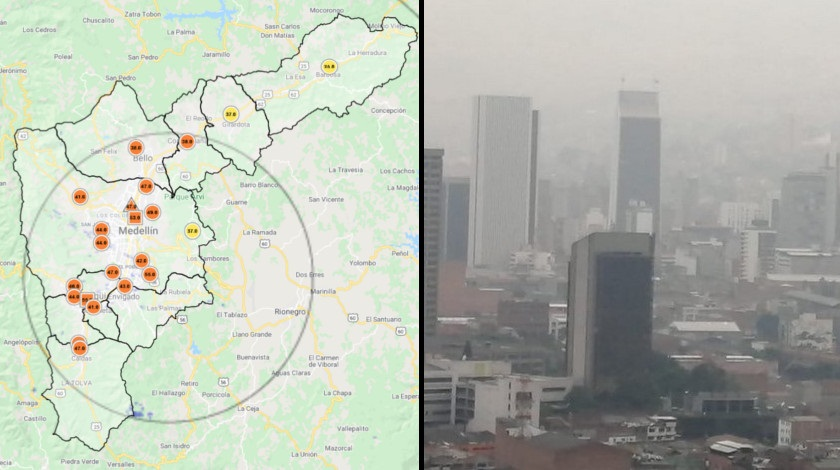

In [ ]:
from IPython.display import Image
#https://www.minuto30.com/foto-calidad-del-aire-de-medellin-y-el-valle-de-aburra-no-mejora-a-pesar-del-pico-y-placa-de-24-horas/984161/ --- 2020
Image(filename='calidad.aire.jpg')


**1. Problema**

La calidad del aire en el Valle de Aburrá se ha convertido en una preocupación ambiental y de salud pública creciente debido a los altos niveles de contaminación registrados en los últimos años. Entre 2017 y 2024, las concentraciones de contaminantes atmosféricos como el material particulado (PM2.5 y PM10) han superado regularmente los límites recomendados, lo cual ha desencadenado alertas ambientales y ha impactado negativamente en la salud de la población. Aunque las autoridades han implementado diversas políticas para reducir las emisiones, los episodios críticos persisten, y los factores que determinan la variabilidad en los niveles de contaminación no han sido completamente comprendidos.
Los factores climáticos, económicos y sociales (como el crecimiento del parque automotor, la expansión industrial y las condiciones meteorológicas) influyen en la calidad del aire, pero su impacto específico y la forma en que interactúan para exacerbar o mitigar la contaminación no han sido identificados con precisión. Esta falta de comprensión limita la efectividad de las estrategias de control y prevención de la contaminación, dificultando la planificación de acciones más eficientes para mejorar la calidad del aire y proteger la salud de los habitantes.

Por tanto, se plantea la necesidad de analizar cómo han variado las concentraciones de contaminantes en el Valle de Aburrá entre 2017 y 2024 y de identificar los factores climáticos, económicos y sociales que han influido en estos cambios. Este análisis permitirá desarrollar modelos predictivos que anticipen episodios de alta contaminación y faciliten la implementación de políticas más efectivas para reducir el impacto de la contaminación del aire en el Valle de Aburrá.

**Contexto General:**

**Crecimiento Urbano y Desarrollo Industrial:** La expansión urbana y el crecimiento de la industria en el Valle de Aburrá han generado un aumento significativo en las emisiones de contaminantes, especialmente material particulado (PM10 y PM2.5).

**Factores Climáticos:** Las condiciones climáticas, como la temperatura, la humedad y los vientos, influyen en la dispersión de contaminantes. El fenómeno de inversión térmica, frecuente en la región, puede atrapar contaminantes cerca de la superficie, exacerbando la mala calidad del aire.

**Impacto de la Pandemia:** La llegada de la pandemia de COVID-19 en 2020 trajo consigo cambios drásticos en el comportamiento humano, incluyendo la reducción del tráfico vehicular y la paralización de algunas actividades industriales. Esto generó una disminución temporal en los niveles de contaminación, lo que plantea la pregunta de cómo se recuperó la calidad del aire post-pandemia.


**Objetivos del Estudio:**

Analizar la calidad del aire en el Valle de Aburrá entre 2017 y septiembre de 2024.

Evaluar el impacto de la pandemia en los niveles de contaminación.

Desarrollar un modelo predictivo para anticipar la calidad del aire  para el año 2025.


**1. Variables de Contaminación del Aire**

**PM2.5 y PM10:** Material particulado fino y grueso; es crucial para evaluar la calidad del aire y el impacto de fuentes como el tráfico vehicular e industrial.

**PM2.5 (Material particulado fino)**

**Unidad:** µg/m³

**Rangos sugeridos:**   

    **Buena:** 0 - 12 µg/m³

    **Moderada:** 12.1 - 35.4 µg/m³

    **Mala:** 35.5 - 55.4 µg/m³

    **Muy mala:** 55.5 - 150.4 µg/m³

    **Extremadamente mala:** 150.5 µg/m³ y superior

**PM10 (Material particulado grueso)**

**Unidad:** µg/m³

**Rangos sugeridos:**

    **Buena:** 0 - 20 µg/m³

    **Moderada:** 20.1 - 50 µg/m³

    **Mala:** 50.1 - 100 µg/m³

    **Muy mala:** 100.1 - 250 µg/m³

    **Extremadamente mala:** 250.1 µg/m³ y superior


**IMPACTO**

A partir de la información analizada se podría predecir cuándo es más probable que ocurran episodios de alta contaminación. El modelo predictivo puede integrarse en un sistema de alertas para la toma de decisiones en tiempo real, emitiendo alertas cuando se anticipa un empeoramiento en la calidad del aire. 


### Proceso de Análisis de Calidad del Aire en el Valle de Aburrá

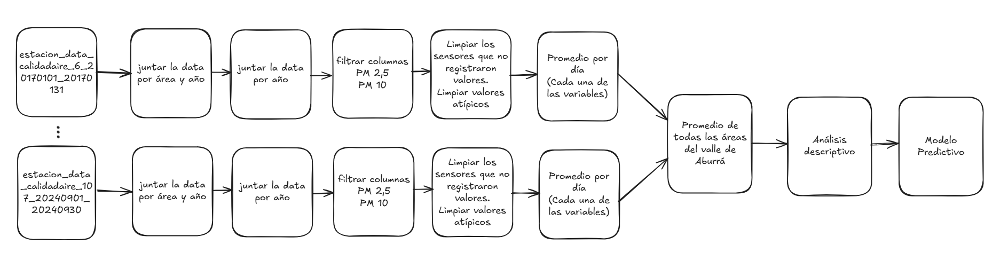

In [3]:
from IPython.display import Image
Image(filename='Proceso de Analisis.png')

**Preparación de datos.**

Debido a que la data que se obtuvo es directamente desde el SIATA, donde la suministra un archivo por cada aréa (estación) y adicionalmente por cada mes, decidimos realizar la concatenación de todas las bases de datos, haciendolo respecto al área y al año.

In [1]:
# Carga de librerias
import warnings                                  # `do not disturbe` mode
warnings.filterwarnings('ignore')
#Librerias 

import pandas as pd
import glob #Permite encontrar archivos y directorios en el sistema de archivos que coinciden con un patrón específico.
import re #Es la librería de expresiones regulares, usada para buscar, validar, reemplazar y extraer patrones de texto en cadenas
import numpy as np
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs
from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization

from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

from itertools import product                    # some useful functions
from tqdm import tqdm_notebook


In [ ]:
# Encuentra todos los archivos en la carpeta actual que sigan el patrón dado
file_paths = glob.glob("Pre\estacion_data_calidadaire_*.csv")

# Diccionario para almacenar los DataFrames agrupados por área y año
data_by_area_year = {}

# Procesa cada archivo
for file in file_paths:

    # Extrae el área y el año del nombre del archivo usando expresiones regulares
    match = re.search(r"calidadaire_(\d+)_(\d{4})", file)
    if match:
        area = match.group(1)  
        year = match.group(2)  
        
        # Lee el archivo y asigna nombre a la primera columna
        try:
            df = pd.read_csv(file)  
            df.rename(columns={df.columns[0]: 'fecha'}, inplace=True)  # Renombra la primera columna a "fecha"
        except Exception as e:
            print(f"Error al leer el archivo {file}: {e}")
            continue
        
        # Convierte la columna de fecha a tipo datetime
        df['fecha'] = pd.to_datetime(df['fecha'], errors='coerce')
        
        # Crea una clave única para cada área y año
        key = f"{area}_{year}"
        
        # Si la clave ya existe, concatena el nuevo DataFrame
        if key in data_by_area_year:
            data_by_area_year[key] = pd.concat([data_by_area_year[key], df])
        else:
            data_by_area_year[key] = df

# Carpeta de salida
output_directory = "Data/"

# Guarda cada DataFrame combinado en un archivo separado
for key, df in data_by_area_year.items():
   
    # Guarda el archivo combinado para el área y el año actual
    try:
        df.to_csv(f"{output_directory}area_{key}_completo.csv", index=False)
        print(f"Archivo anual para área {key} creado en {output_directory}.")
    except Exception as e:
        print(f"Error al guardar el archivo para {key}: {e}")

A continuación, lo realizamos concatenando todas las áreas en archivos solo de los años y adicionalmente filtramos solo las columnas que necesitamos, fecha, codigoSerial, pm25, pm10

In [ ]:
# Encuentra todos los archivos en la carpeta "Data" que sigan el patrón dado
file_paths = glob.glob(r"Data\area_*.csv")

# Diccionario para almacenar los DataFrames agrupados por año
data_by_year = {}

# Columnas necesarias para el análisis
required_columns = ['fecha', 'codigoSerial', 'pm25', 'pm10']

# Procesa cada archivo
for file in file_paths:
    print(f"Procesando archivo: {file}")
    # Extrae el año del nombre del archivo usando expresiones regulares
    match = re.search(r"_(\d{4})_completo\.csv", file)
    if match:
        year = match.group(1)  
        
        # Lee el archivo
        try:
            df = pd.read_csv(file)
        except Exception as e:
            print(f"Error al leer el archivo {file}: {e}")
            continue
                  
        # Filtra el DataFrame para que solo tenga las columnas necesarias
        df = df[required_columns]

        # Reemplaza -9999 y 99999 por NaN
        df.replace(-9999, np.nan, inplace=True)
        df.replace(99999, np.nan, inplace=True)

        # Reemplazar valores negativos en pm25 y pm10 con NaN
        df['pm25'] = df['pm25'].apply(lambda x: np.nan if x < 0 else x)
        df['pm10'] = df['pm10'].apply(lambda x: np.nan if x < 0 else x)

        # Imputar valores negativos con la mediana del día correspondiente
        for date in df['fecha'].unique():
            daily_data = df[df['fecha'] == date]
            pm25_median = daily_data['pm25'].median()
            pm10_median = daily_data['pm10'].median()
            
            df.loc[(df['fecha'] == date) & (df['pm25'].isna()), 'pm25'] = pm25_median
            df.loc[(df['fecha'] == date) & (df['pm10'].isna()), 'pm10'] = pm10_median

        # Si el año ya existe, concatena el nuevo DataFrame
        if year in data_by_year:
            data_by_year[year] = pd.concat([data_by_year[year], df], ignore_index=True)
        else:
            data_by_year[year] = df

# Carpeta de salida
output_directory = "Data/Data Por Años/Data Prueba"

# Guarda cada DataFrame combinado por año en un archivo separado
for year, df in data_by_year.items():
    # Ordena por fecha 
    if 'fecha' in df.columns:
        df = df.sort_values(by='fecha')
    
    # Guarda el archivo combinado para el año actual
    try:
        df.to_csv(f"{output_directory}calidadaire_{year}_completo.csv", index=False)
        print(f"Archivo combinado para el año {year} creado en {output_directory}.")
    except Exception as e:
        print(f"Error al guardar el archivo para {year}: {e}")


In [3]:
prueba = pd.read_csv('Data/Data Por Años/Data Pruebacalidadaire_2017_completo.csv')
prueba.head(20)

,fecha,codigoSerial,pm25,pm10
0,2017-01-01 00:00:00,12,65.0,97.0
1,2017-01-01 00:00:00,6,NaN,11.0
2,2017-01-01 00:00:00,46,NaN,73.0
3,2017-01-01 00:00:00,28,139.0,NaN
4,2017-01-01 00:00:00,41,NaN,NaN
5,2017-01-01 00:00:00,37,NaN,37.0
6,2017-01-01 00:00:00,40,NaN,NaN
7,2017-01-01 00:00:00,38,40.0,61.0
8,2017-01-01 01:00:00,6,NaN,30.0
9,2017-01-01 01:00:00,46,NaN,142.0


In [4]:
# Obtener los valores más grandes de 'pm25' y 'pm10'
top_pm25 = prueba['pm25'].nlargest(10) 
top_pm10 = prueba['pm10'].nlargest(10)

print("Valores más altos de PM2.5:")
print(top_pm25)
print("\nValores más altos de PM10:")
print(top_pm10)

Valores más altos de PM2.5:
2983    995.0
2988    995.0
3166    995.0
3564    995.0
3933    995.0
4751    995.0
4758    995.0
5678    995.0
5680    995.0
5701    995.0
Name: pm25, dtype: float64

Valores más altos de PM10:
1069    995.0
2968    995.0
2977    995.0
2983    995.0
2988    995.0
3399    995.0
3538    995.0
3564    995.0
4563    995.0
4572    995.0
Name: pm10, dtype: float64


In [5]:
prueba.describe()

,codigoSerial,pm25,pm10
count,106704.000000,50607.000000,42237.000000
mean,46.986055,25.423947,55.297297
std,25.314317,59.229775,86.988991
min,6.000000,0.000000,0.000000
25%,37.000000,13.000000,31.000000
50%,41.000000,19.785300,43.000000
75%,78.000000,28.314450,61.000000
max,88.000000,995.000000,995.000000


Agrupamos todas las fechas y codigo Serial calculando el promedio de por cada dia 

In [2]:
# Cargar todos los archivos CSV en una lista de DataFrames
archivos = glob.glob("Data/Data Por Años/Data Pruebacalidadaire_*_completo.csv")
dataframes = [pd.read_csv(archivo) for archivo in archivos]

# Combinar todos los DataFrames en uno solo
df = pd.concat(dataframes, ignore_index=True)

# Convertir la columna 'fecha' a formato datetime y extraer solo la fecha (sin horas)
df['fecha'] = pd.to_datetime(df['fecha']).dt.date

# Imputar valores NaN con la mediana diaria
for fecha in df['fecha'].unique():
    datos_dia = df[df['fecha'] == fecha]
    mediana_pm25 = datos_dia['pm25'].median()
    mediana_pm10 = datos_dia['pm10'].median()
    df.loc[(df['fecha'] == fecha) & (df['pm25'].isna()), 'pm25'] = mediana_pm25
    df.loc[(df['fecha'] == fecha) & (df['pm10'].isna()), 'pm10'] = mediana_pm10

# Agrupar por 'fecha' y 'codigoSerial' y calcular el promedio de 'pm25' y 'pm10'
df_Agg = df.groupby(['fecha', 'codigoSerial'], as_index=False).agg({'pm25': 'mean', 'pm10': 'mean'})

# Mostrar los primeros resultados
df_Agg.head(20)

,fecha,codigoSerial,pm25,pm10
0,2017-01-01,6,28.500000,38.250000
1,2017-01-01,12,58.708333,88.458333
2,2017-01-01,28,58.791667,39.000000
3,2017-01-01,37,28.500000,44.125000
4,2017-01-01,38,33.250000,53.875000
5,2017-01-01,40,28.500000,39.000000
6,2017-01-01,41,28.500000,39.000000
7,2017-01-01,46,28.500000,72.166667
8,2017-01-02,6,15.500000,32.541667
9,2017-01-02,12,23.666667,51.291667


In [3]:
df_Agg.set_index('fecha', inplace=True)
df_Agg.head(20)

,codigoSerial,pm25,pm10
fecha,,,
2017-01-01,6,28.500000,38.250000
2017-01-01,12,58.708333,88.458333
2017-01-01,28,58.791667,39.000000
2017-01-01,37,28.500000,44.125000
2017-01-01,38,33.250000,53.875000
2017-01-01,40,28.500000,39.000000
2017-01-01,41,28.500000,39.000000
2017-01-01,46,28.500000,72.166667
2017-01-02,6,15.500000,32.541667


In [4]:
df_Agg.describe()

,codigoSerial,pm25,pm10
count,66446.000000,6.644600e+04,66446.000000
mean,66.178987,1.524129e+02,46.323602
std,27.531235,2.285979e+04,452.014951
min,6.000000,2.500000e-01,1.166667
25%,41.000000,1.271031e+01,31.500000
50%,80.000000,1.625000e+01,37.166667
75%,86.000000,2.142004e+01,45.500000
max,107.000000,4.166645e+06,54921.808333


**Variable pm25 (Concentración de partículas PM2.5)**
Conteo (count): 66,446 registros disponibles.

Media (mean): 152.41, lo que sugiere una alta concentración promedio de partículas PM2.5 en el aire.

Desviación estándar (std): 22,859.79, lo que indica una dispersión extremadamente alta en los valores.

Rango:

Mínimo (min): 0.25, una concentración muy baja.
Máximo (max): 4,166,645, lo cual es un valor muy alto y probablemente un outlier o error en los datos.

Cuartiles:

El 25% de las concentraciones están por debajo de 12.71.
El 50% (mediana) de las concentraciones están en 16.25 o menos.
El 75% de las concentraciones no exceden los 21.42.

Interpretación: Aunque la media es muy alta, está fuertemente influenciada por valores atípicos (como el máximo). Los cuartiles indican que la mayoría de los valores están mucho más cerca del rango bajo (12-21). Este comportamiento sugiere que sería necesario investigar los outliers para determinar su validez.

**Variable pm10 (Concentración de partículas PM10)**

Conteo (count): 66,446 registros disponibles.

Media (mean): 46.32, lo que indica una concentración promedio más moderada que PM2.5.

Desviación estándar (std): 452.01, una variabilidad significativa.

Rango:

Mínimo (min): 1.16, concentración baja.
Máximo (max): 54,921.81, otro valor extremadamente alto que probablemente sea un outlier o error en los datos.

Cuartiles:

El 25% de las concentraciones están por debajo de 31.5.
El 50% (mediana) está en 37.17.
El 75% de las concentraciones no exceden los 45.5.

Interpretación: Al igual que con PM2.5, los valores promedio están influenciados por outliers. Sin estos valores extremos, la concentración de PM10 parece estar mucho más distribuida en el rango de 31-45.

**Conclusiones Generales:**

Outliers:

Ambas variables, pm25 y pm10, presentan valores máximos que son sospechosamente altos. Esto podría deberse a errores de medición o de registro, y deberían ser investigados.
La eliminación o ajuste de estos outliers podría dar una imagen más realista de los datos.

Concentraciones de PM:

Aunque hay valores extremadamente altos, la mayoría de los registros de PM2.5 y PM10 están en rangos más bajos, como indican los cuartiles.
Las concentraciones medias y la dispersión sugieren variabilidad en la calidad del aire dependiendo de la ubicación o el período de tiempo.



In [22]:
# Obtener los valores más grandes de 'pm25' y 'pm10'
top_pm25 = df_Agg['pm25'].nlargest(6) 
top_pm10 = df_Agg['pm10'].nlargest(13)

print("Valores más altos de PM2.5:")
print(top_pm25)
print("\nValores más altos de PM10:")
print(top_pm10)

Valores más altos de PM2.5:
fecha
2024-05-11    4.166645e+06
2023-09-07    4.166641e+06
2023-03-15    8.152982e+03
2022-04-27    7.122675e+03
2024-02-02    5.365414e+03
2019-09-03    5.322473e+03
Name: pm25, dtype: float64

Valores más altos de PM10:
fecha
2018-06-16    54921.808333
2018-06-17    54795.900000
2018-06-18    54684.200000
2018-06-19    47638.095833
2018-04-08    23368.862500
2018-06-15    22872.462500
2018-06-20    20867.391667
2018-06-06    20600.654167
2018-06-07    11671.491667
2018-05-27    11288.250000
2018-05-23     7038.229167
2018-04-07     4706.725000
2018-05-24     2385.283333
Name: pm10, dtype: float64


In [5]:
df_Agg_C = df_Agg.copy()
df_Agg_C


,codigoSerial,pm25,pm10
fecha,,,
2017-01-01,6,28.500000,38.250000
2017-01-01,12,58.708333,88.458333
2017-01-01,28,58.791667,39.000000
2017-01-01,37,28.500000,44.125000
2017-01-01,38,33.250000,53.875000
...,...,...,...
2024-09-30,101,13.166667,30.791667
2024-09-30,103,17.875000,40.000000
2024-09-30,104,84.625000,86.875000


Total de registros: 66446
Outliers detectados: 665
Datos válidos: 65781


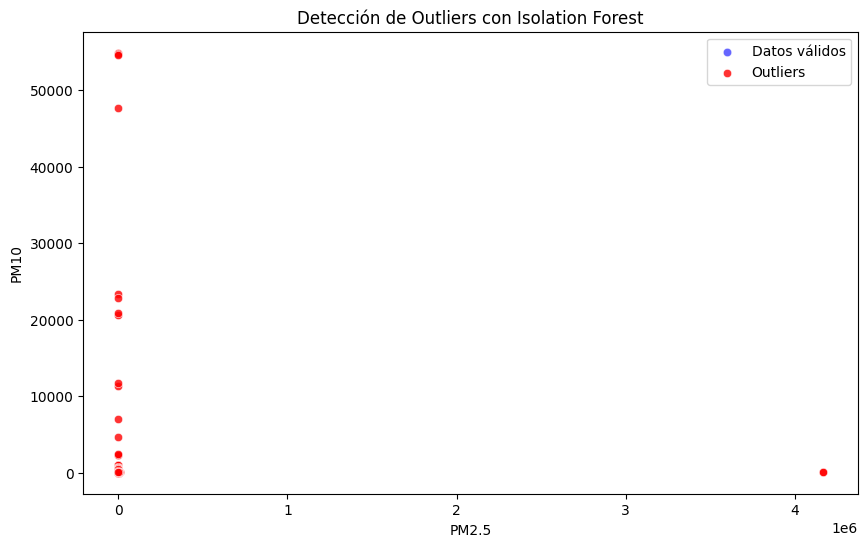

Análisis descriptivo después de manejar outliers:
               pm25          pm10
count  66446.000000  66446.000000
mean      18.648056     39.886017
std       11.376554     13.862122
min        0.250000      1.166667
25%       12.727210     31.500000
50%       16.168872     37.000000
75%       21.166667     45.000000
max      305.250000    169.416667


In [6]:

# Reemplazar valores NaN con 0 para que el modelo funcione.
X = df_Agg_C[['pm25', 'pm10']].fillna(0)

# Paso 3: Crear y configurar el modelo IsolationForest
isolation_forest = IsolationForest(
    n_estimators=100,          # Número de árboles en el bosque
    contamination=0.01,        # Porcentaje esperado de outliers en los datos
    random_state=42            # Asegura resultados reproducibles
)

# Paso 4: Entrenar el modelo y predecir outliers
df_Agg_C['is_outlier'] = isolation_forest.fit_predict(X)

# Paso 5: Filtrar los datos según los resultados del modelo
outliers = df_Agg_C[df_Agg_C['is_outlier'] == -1]   # Filtrar outliers
filtered_data = df_Agg_C[df_Agg_C['is_outlier'] == 1]  # Filtrar datos válidos

# Mostrar información sobre los resultados
print(f"Total de registros: {len(df_Agg_C)}")
print(f"Outliers detectados: {len(outliers)}")
print(f"Datos válidos: {len(filtered_data)}")

# Paso 6: Visualizar los resultados
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_data, x='pm25', y='pm10', label='Datos válidos', color='blue', alpha=0.6)
sns.scatterplot(data=outliers, x='pm25', y='pm10', label='Outliers', color='red', alpha=0.8)
plt.legend()
plt.title('Detección de Outliers con Isolation Forest')
plt.xlabel('PM2.5')
plt.ylabel('PM10')
plt.show()

# Paso 7: Reemplazar los outliers con la mediana de los datos válidos
# Calculamos la mediana de los datos válidos y la usamos para imputar outliers.
for col in ['pm25', 'pm10']:
    median = filtered_data[col].median()
    df_Agg_C.loc[df_Agg_C['is_outlier'] == -1, col] = median


# Paso 9: Revisar el análisis descriptivo después de manejar los outliers
print("Análisis descriptivo después de manejar outliers:")
print(df_Agg_C[['pm25', 'pm10']].describe())


**# ANÁLISIS DESCRIPTIVO**

In [7]:
# 1. Descripción general de los datos
print("Descripción general del DataFrame:")
print(df_Agg_C.info())

# Estadísticas descriptivas
print("\nEstadísticas descriptivas:")
print(df_Agg_C[['pm25', 'pm10']].describe())

Descripción general del DataFrame:
<class 'pandas.core.frame.DataFrame'>
Index: 66446 entries, 2017-01-01 to 2024-09-30
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   codigoSerial  66446 non-null  int64  
 1   pm25          66446 non-null  float64
 2   pm10          66446 non-null  float64
 3   is_outlier    66446 non-null  int64  
dtypes: float64(2), int64(2)
memory usage: 4.6+ MB
None

Estadísticas descriptivas:
               pm25          pm10
count  66446.000000  66446.000000
mean      18.648056     39.886017
std       11.376554     13.862122
min        0.250000      1.166667
25%       12.727210     31.500000
50%       16.168872     37.000000
75%       21.166667     45.000000
max      305.250000    169.416667


**Variable pm25 (Concentración de partículas PM2.5)**

Conteo (count): 66,446 datos disponibles, lo que indica que no hay valores perdidos en esta variable.

Media (mean): 18.65, una concentración promedio de PM2.5 que parece razonable según estándares de calidad del aire en muchas regiones urbanas.

Desviación estándar (std): 11.38, lo que indica cierta dispersión de los valores, pero no es excesivamente alta.

Mínimo (min): 0.25, un valor muy bajo que podría reflejar aire limpio o una zona rural.

Cuartiles:

El 25% de las concentraciones están por debajo de 12.73.
La mediana (50%) está en 16.17, lo que sugiere que la mayoría de los valores se concentran alrededor de este rango.
El 75% no supera 21.17.

Máximo (max): 305.25, un valor significativamente alto. Aunque no es extremo en comparación con los datos anteriores, podría representar episodios críticos de contaminación o outliers.

Interpretación:

La mayoría de los valores de PM2.5 se encuentran en rangos razonables (12-21), indicando una calidad del aire moderada.

**Variable pm10 (Concentración de partículas PM10)**

Conteo (count): 66,446 datos disponibles, lo que nuevamente indica que no hay valores perdidos.

Media (mean): 39.89, lo que sugiere una concentración promedio más alta que PM2.5, como es esperable, dado que las partículas PM10 incluyen partículas más grandes.

Desviación estándar (std): 13.86, lo que indica una dispersión moderada.

Mínimo (min): 1.17, un valor bajo que podría reflejar una buena calidad del aire.

Cuartiles:

El 25% de las concentraciones están por debajo de 31.5.
La mediana (50%) es 37.0, lo que confirma que los valores se concentran en niveles moderados.
El 75% no supera 45.0.

Máximo (max): 169.42, un valor alto que podría representar contaminación en zonas específicas o días de condiciones atmosféricas adversas.

Interpretación:

La mayoría de los valores de PM10 se encuentran en rangos más altos que PM2.5, como es típico.

**Comparación entre PM2.5 y PM10**

    Promedio: PM10 tiene una media más del doble que PM2.5 (39.89 frente a 18.65), lo cual es consistente con la naturaleza de las partículas.

    Variabilidad: PM10 tiene una desviación estándar más baja (13.86 frente a 11.38 en términos absolutos) en proporción a su rango, lo que indica una distribución algo más homogénea.

    Rango: PM2.5 tiene un rango mayor (0.25 a 305.25) que PM10 (1.17 a 169.42), lo que indica que los eventos extremos tienden a impactar más la concentración de PM2.5.

**Conclusiones**

    Distribución: Los cuartiles sugieren que ambas variables tienen una distribución asimétrica hacia la derecha, con la mayoría de los datos en rangos moderados.

In [ ]:
#Visualización de la distribución de los datos
plt.figure(figsize=(12, 6))

# Histograma de pm25
plt.subplot(1, 2, 1)
sns.histplot(df_Agg_C['pm25'], kde=True, bins=50, color='blue')
plt.title("Distribución de PM2.5")
plt.xlabel("PM2.5")
plt.ylabel("Frecuencia")

# Histograma de pm10
plt.subplot(1, 2, 2)
sns.histplot(df_Agg_C['pm10'], kde=True, bins=50, color='green')
plt.title("Distribución de PM10")
plt.xlabel("PM10")
plt.ylabel("Frecuencia")

plt.tight_layout()
plt.show()

In [6]:
# 4. Análisis temporal (si tienes fechas)
if 'fecha' in df_Agg_C.columns:
    df_Agg_C['fecha'] = pd.to_datetime(df_Agg_C['fecha'])  # Asegúrate de que 'fecha' sea tipo datetime
    
    # Promedio mensual de PM2.5 y PM10
    df_monthly = df_Agg_C.groupby(df_Agg_C['fecha'].dt.to_period('M')).agg({'pm25': 'mean', 'pm10': 'mean'}).reset_index()
    df_monthly['fecha'] = df_monthly['fecha'].dt.to_timestamp()

    plt.figure(figsize=(12, 6))
    plt.plot(df_monthly['fecha'], df_monthly['pm25'], label='PM2.5', marker='o')
    plt.plot(df_monthly['fecha'], df_monthly['pm10'], label='PM10', marker='o')
    plt.title("Promedio mensual de PM2.5 y PM10")
    plt.xlabel("Fecha")
    plt.ylabel("Concentración")
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
# 5. Correlación entre PM2.5 y PM10
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_Agg_C['pm25'], y=df_Agg_C['pm10'], alpha=0.5, color='purple')
plt.title("Correlación entre PM2.5 y PM10")
plt.xlabel("PM2.5")
plt.ylabel("PM10")
plt.grid()
plt.show()

# Calcular el coeficiente de correlación
correlation = df_Agg['pm25'].corr(df_Agg['pm10'])
print(f"\nCoeficiente de correlación entre PM2.5 y PM10: {correlation:.2f}")


In [ ]:
# Gráfico de líneas para PM2.5 y PM10
plt.figure(figsize=(15, 6))
plt.plot(df_Agg_C.index, df_Agg_C['pm25'], label='PM2.5', color='blue', alpha=0.7)
plt.plot(df_Agg_C.index, df_Agg_C['pm10'], label='PM10', color='green', alpha=0.7)
plt.title("Concentración temporal de PM2.5 y PM10")
plt.xlabel("Fecha")
plt.ylabel("Concentración")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
# Scatter plot para visualizar la relación entre Population y Average Income
sns.scatterplot(x='pm25', y='pm10', data=df_Agg_C)

plt.tight_layout()
plt.show()

In [ ]:
# Matriz de correlación entre variables numéricas
plt.figure(figsize=(10, 8))
correlation_matrix = df_Agg_C[['pm25','pm10','codigoSerial']].corr()

# Mapa de calor de la matriz de correlación
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

In [ ]:
sns.pairplot(df_Agg_C[['codigoSerial','pm25','pm10']], diag_kind='kde')
plt.show()

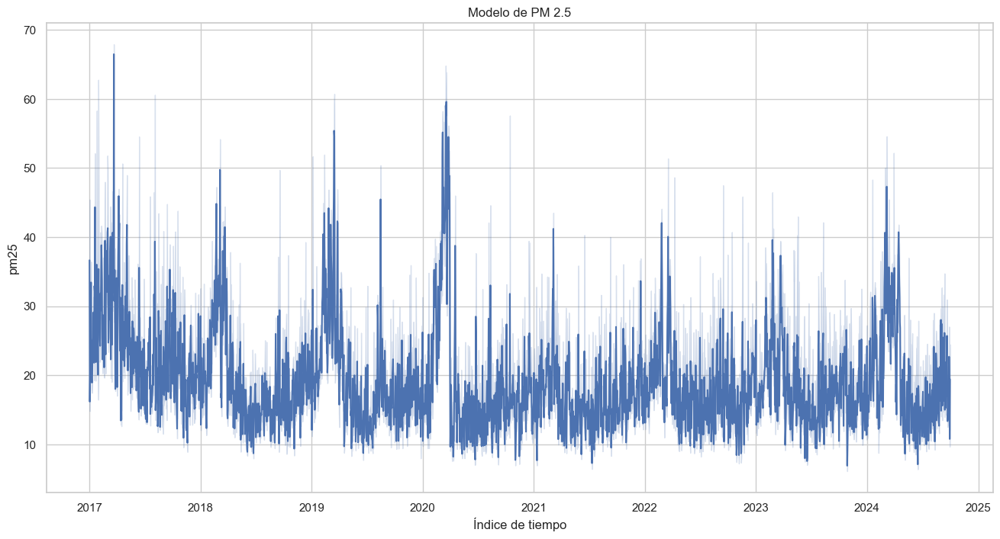

In [55]:
plt.figure(figsize=(16, 8))
p = sns.lineplot(df_Agg_C['pm25'])
p.set_title('Modelo de PM 2.5')
p.set_xlabel('Índice de tiempo')
plt.show()

No se observa una tendencia clara hacia la disminución o aumento sostenido de PM2.5 en el periodo analizado.

Sin embargo, los picos recurrentes sugieren eventos estacionales específicos.

Picos destacados:

Los niveles más altos se registran en años como 2019 y 2020. Esto podría deberse a una combinación de factores como condiciones climáticas, patrones de tráfico y actividades industriales.

Impacto de la pandemia (2020-2021):

Durante el inicio de la pandemia (marzo de 2020), en muchas ciudades del mundo se observó una mejora en la calidad del aire debido a las cuarentenas estrictas y la disminución del tráfico vehicular.

Es probable que haya habido una reducción en los niveles de PM2.5 durante los periodos de confinamiento, aunque los picos posteriores reflejan una rápida recuperación de las actividades económicas.

Estacionalidad:

Los picos de contaminación parecen correlacionarse con estaciones secas donde las condiciones atmosféricas dificultan la dispersión de contaminantes.

Esto puede relacionarse con el fenómeno del “Efecto tapa de olla”, común en el Valle de Aburrá, causado por la inversión térmica.

Fluctuaciones recientes (2023-2024):

Aunque no es tan pronunciado como en 2019-2020, parece haber un repunte en los niveles de PM2.5, lo que sugiere que las políticas actuales no han logrado una mejora sostenida.

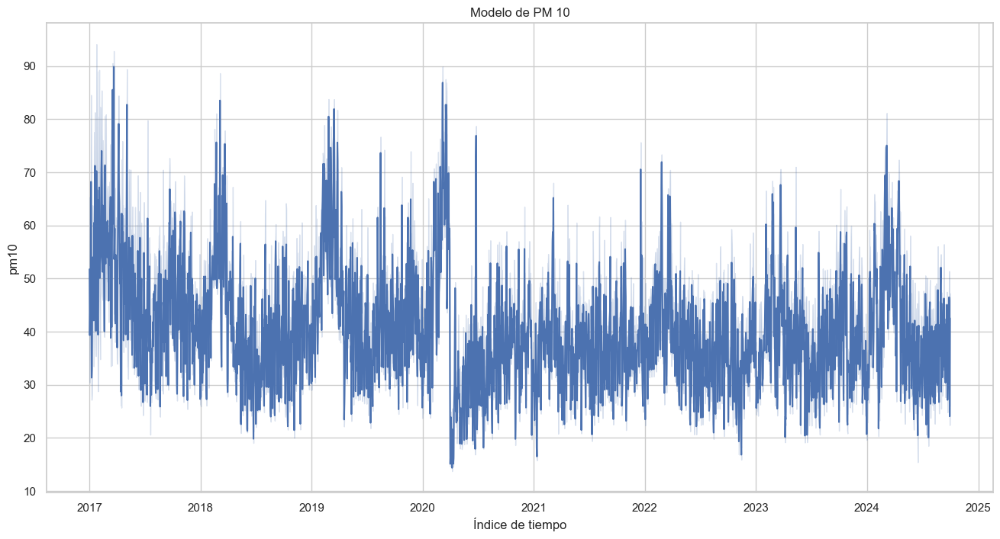

In [56]:
plt.figure(figsize=(16, 8))
p = sns.lineplot(df_Agg_C['pm10'])
p.set_title('Modelo de PM 10')
p.set_xlabel('Índice de tiempo')
plt.show()

Los niveles de PM10 presentan fluctuaciones a lo largo del tiempo, con picos periódicos en ciertos momentos.

Se observan reducciones y aumentos abruptos que podrían estar asociados a factores estacionales, climáticos o eventos específicos.

Impacto de la Pandemia (2020):

A principios de 2020, coincidiendo con el inicio de las medidas de cuarentena estricta por la pandemia de COVID-19, hay una notable reducción en los niveles de PM10.

Esto se debe a una disminución en las actividades industriales, el tráfico vehicular y las emisiones relacionadas con actividades humanas.

Recuperación Post-pandemia:

Después de 2021, los niveles de PM10 tienden a incrementarse nuevamente, posiblemente debido a la reactivación económica y el regreso a las actividades normales.

Estacionalidad:

Los picos recurrentes sugieren patrones estacionales. Estos pueden estar relacionados con:

Temporadas secas, donde la dispersión de partículas es menor.

Mayor actividad vehicular y eventos de quema (como incendios forestales o agrícolas).

para ayudarnos un poco en el análisis, decidimos agregar 3 columnas. 

In [8]:
# Asegurarse de que el índice es de tipo datetime
if not pd.api.types.is_datetime64_any_dtype(df_Agg_C.index):
    df_Agg_C.index = pd.to_datetime(df_Agg_C.index)

# Crear nuevas columnas para año, mes y día
df_Agg_C['año'] = df_Agg_C.index.year
df_Agg_C['mes'] = df_Agg_C.index.month
df_Agg_C['día'] = df_Agg_C.index.day

In [9]:
df_Agg_C.sample(5, random_state=0)

,codigoSerial,pm25,pm10,is_outlier,año,mes,día
fecha,,,,,,,
2020-03-23,40,45.679750,61.500000,1,2020,3,23
2018-10-19,69,22.741149,40.000000,1,2018,10,19
2022-09-18,28,11.625000,21.000000,1,2022,9,18
2024-09-04,12,29.541667,47.916667,1,2024,9,4
2023-02-02,86,24.674025,48.000000,1,2023,2,2


In [10]:
# Eliminar una columna específica por su nombre
df_Agg_C = df_Agg_C.drop('is_outlier', axis=1)

In [11]:
# Mostrar las primeras filas para verificar que se ha eliminado
df_Agg_C.head()


,codigoSerial,pm25,pm10,año,mes,día
fecha,,,,,,
2017-01-01,6,28.500000,38.250000,2017,1,1
2017-01-01,12,58.708333,88.458333,2017,1,1
2017-01-01,28,58.791667,39.000000,2017,1,1
2017-01-01,37,28.500000,44.125000,2017,1,1
2017-01-01,38,33.250000,53.875000,2017,1,1


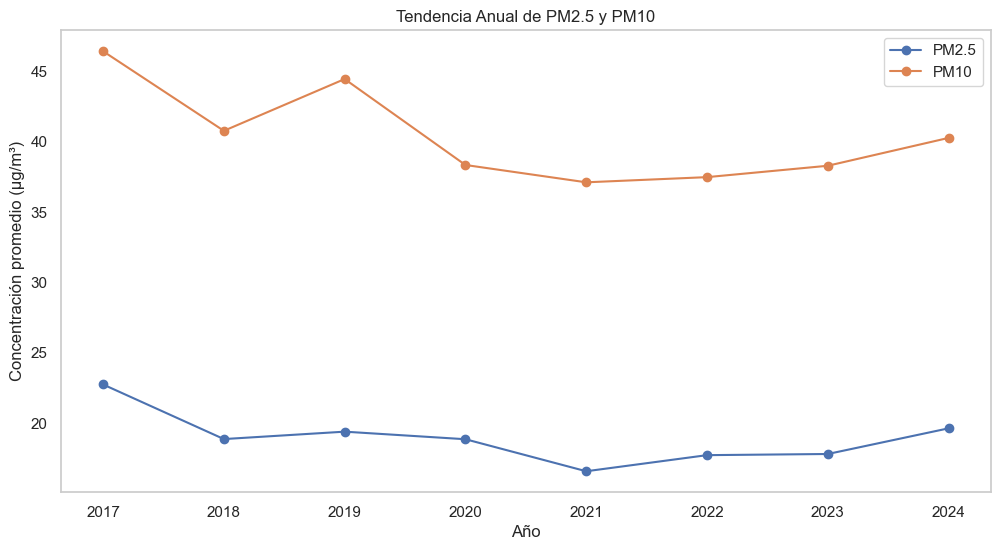

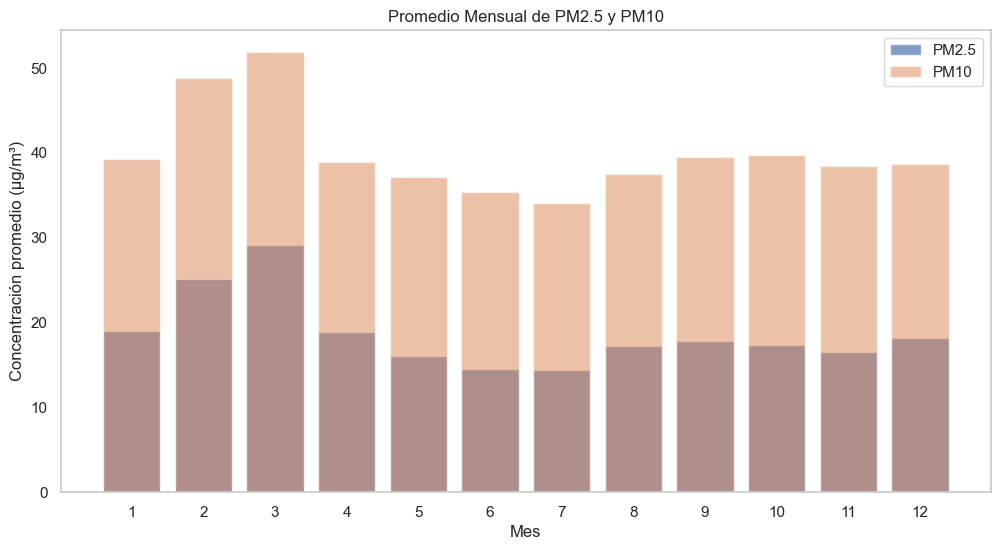

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Agrupar por año y calcular la media de PM2.5 y PM10
temporal_anual = df_Agg_C.groupby('año').agg({'pm25': 'mean', 'pm10': 'mean'}).reset_index()

# Agrupar por mes (sin importar el año) y calcular la media
temporal_mensual = df_Agg_C.groupby('mes').agg({'pm25': 'mean', 'pm10': 'mean'}).reset_index()

# Configurar estilo de los gráficos
sns.set(style="whitegrid")

# Gráfico de tendencias anuales
plt.figure(figsize=(12, 6))
plt.plot(temporal_anual['año'], temporal_anual['pm25'], label='PM2.5', marker='o')
plt.plot(temporal_anual['año'], temporal_anual['pm10'], label='PM10', marker='o')
plt.title('Tendencia Anual de PM2.5 y PM10')
plt.xlabel('Año')
plt.ylabel('Concentración promedio (µg/m³)')
plt.legend()
plt.xticks(temporal_anual['año'])
plt.grid()
plt.show()

# Gráfico de variaciones mensuales promedio
plt.figure(figsize=(12, 6))
plt.bar(temporal_mensual['mes'], temporal_mensual['pm25'], label='PM2.5', alpha=0.7)
plt.bar(temporal_mensual['mes'], temporal_mensual['pm10'], label='PM10', alpha=0.5)
plt.title('Promedio Mensual de PM2.5 y PM10')
plt.xlabel('Mes')
plt.ylabel('Concentración promedio (µg/m³)')
plt.legend()
plt.xticks(temporal_mensual['mes'])
plt.grid()
plt.show()


### TENDENCIA ANUAL

1. Tendencias Observadas
PM10:

Inicia en 2017 con un valor elevado cercano a 46 µg/m³.

Disminuye gradualmente hasta 2021, donde alcanza su valor más bajo (~40 µg/m³).

A partir de 2022, comienza una recuperación constante, alcanzando en 2024 un nivel cercano a los 45 µg/m³, casi igual al de 2017.

PM2.5:

La concentración promedio de PM2.5 es significativamente más baja en comparación con PM10.

Se observa una tendencia decreciente desde 2017 (~25 µg/m³) hasta 2021, donde alcanza su punto más bajo (~15 µg/m³).

A partir de 2022, también presenta un aumento gradual, llegando en 2024 a valores cercanos a 20 µg/m³.

2. Impacto de la Pandemia (2020-2021)

En ambos contaminantes, los niveles disminuyen significativamente durante los años 2020 y 2021. Este descenso puede estar relacionado con la reducción de actividades industriales, el tráfico vehicular y otras fuentes de contaminación debido a las restricciones impuestas por la pandemia del COVID-19.

3. Recuperación Posterior a la Pandemia (2022 en adelante)

A partir de 2022, los niveles de PM2.5 y PM10 muestran una recuperación. Esto podría deberse al retorno de las actividades económicas y sociales que incrementan las emisiones contaminantes.

4. Relación entre PM2.5 y PM10

PM10 siempre tiene concentraciones más altas que PM2.5, lo cual es esperable, ya que las partículas PM10 incluyen tanto partículas más grandes como aquellas en la fracción PM2.5.
La relación entre ambos contaminantes se mantiene constante en términos de tendencia (si PM10 sube, PM2.5 también lo hace).

5. Posibles Factores a Considerar

Políticas Ambientales: Los años con menor contaminación podrían coincidir con implementación de políticas ambientales o mejoras en tecnología vehicular/industrial.

Condiciones Climáticas: Factores como lluvias o vientos pueden haber afectado la dispersión de partículas en algunos años.

Urbanización: Aumento en la densidad poblacional o actividades urbanas podría justificar el aumento en los últimos años.

**Conclusión**
El gráfico sugiere una clara disminución de la contaminación durante los años de pandemia, seguida de una recuperación que refleja el retorno a las actividades normales. Este análisis destaca la importancia de las medidas ambientales y cómo eventos globales pueden influir en la calidad del aire.

### PROMEDIO MENSUAL

1. Comportamiento Mensual de PM2.5 y PM10

PM10 (parte superior de las barras):

Predomina en la mayoría de los meses, con concentraciones promedio superiores a 30 µg/m³.

Los niveles más altos se observan en los meses de febrero y marzo, alcanzando valores cercanos a 50 µg/m³.

En los meses intermedios, de abril a agosto, hay una disminución relativa, estabilizándose en valores entre 35 y 40 µg/m³.

En septiembre a diciembre, se mantiene constante, pero más bajo que los picos anuales.

PM2.5 (parte inferior de las barras):

Representa una menor proporción de la contaminación total.

También muestra picos en los meses de febrero y marzo, con concentraciones cercanas a 20 µg/m³.

Al igual que PM10, disminuye en los meses intermedios y muestra una estabilización hacia finales del año.

2. Meses Críticos

Los meses con mayor contaminación general (sumatoria de PM2.5 y PM10) son febrero y marzo. Esto podría estar relacionado con fenómenos como:

Condiciones climáticas adversas: Menor dispersión de contaminantes debido a fenómenos atmosféricos.

Actividades humanas: Incremento en emisiones por actividades económicas específicas.

Los meses con menor contaminación se ubican entre mayo y agosto, posiblemente debido a condiciones meteorológicas más favorables (lluvias que limpian el aire, mayor ventilación).

3. Relación entre PM2.5 y PM10

PM10 siempre está por encima de PM2.5, lo cual es esperado dado que las partículas PM10 incluyen partículas más grandes.

Sin embargo, las proporciones entre ambos son consistentes, indicando que ambas fracciones están influenciadas por fuentes similares, como el tráfico vehicular o actividades industriales.

4. Factores a Considerar

Estaciones climáticas: Si el área de estudio tiene estaciones secas y lluviosas bien definidas, estas pueden influir en la concentración de partículas suspendidas.

Eventos específicos: Aumento de emisiones durante festividades, cosechas o quemas agrícolas.

Políticas ambientales: Cambios en las normas o campañas para reducir emisiones podrían afectar los niveles en algunos meses.

5. Conclusión

El gráfico destaca la existencia de una variación estacional en la calidad del aire, con picos de contaminación al inicio del año (febrero y marzo) y una disminución durante los meses intermedios. Este comportamiento podría ser usado para implementar políticas ambientales específicas en los meses más críticos y fomentar estrategias de prevención basadas en el ciclo estacional.

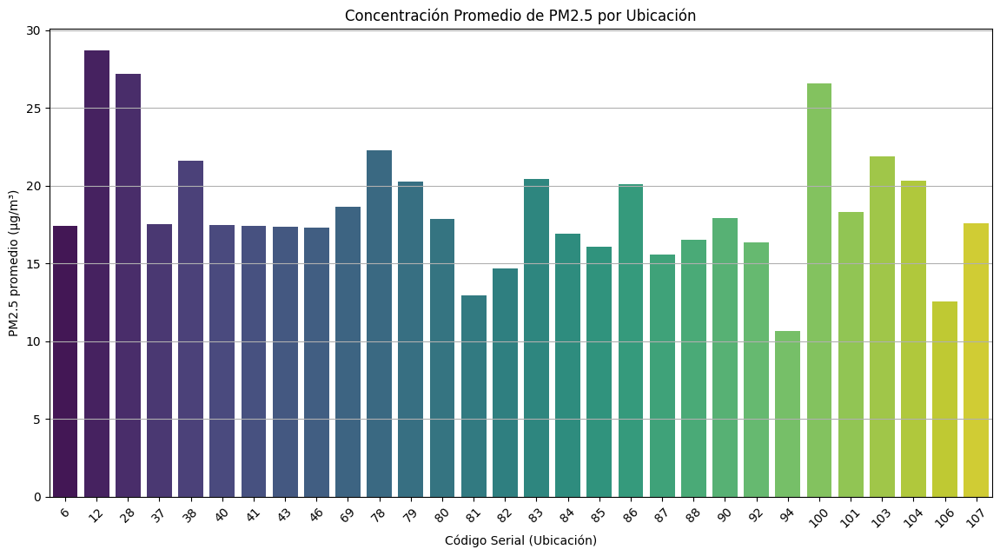

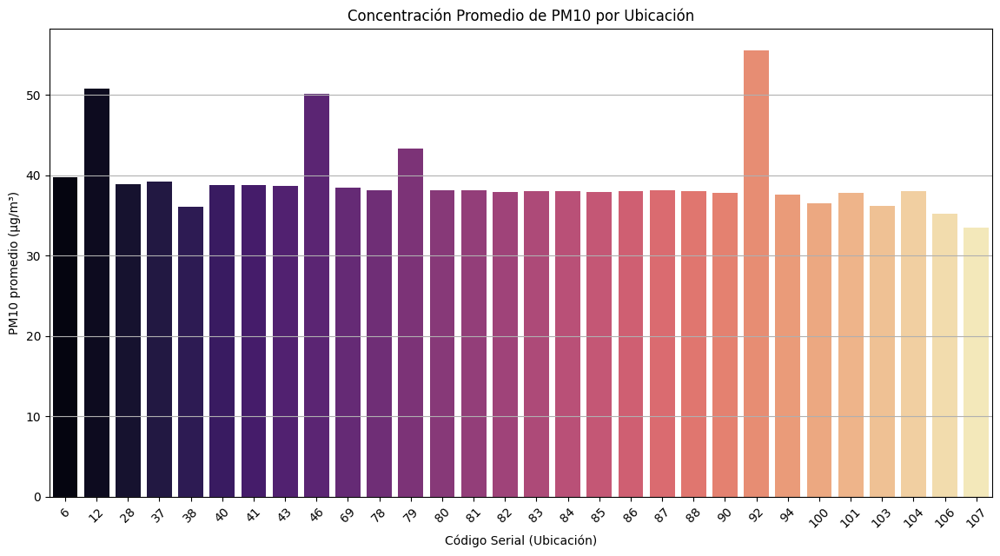

In [12]:
# Agrupar por 'codigoSerial' y calcular la media de PM2.5 y PM10
espacial = df_Agg_C.groupby('codigoSerial').agg({'pm25': 'mean', 'pm10': 'mean'}).reset_index()

# Ordenar por PM2.5 y PM10 para análisis
espacial_sorted = espacial.sort_values(by='pm25', ascending=False)

# Gráfico de barras para PM2.5 por ubicación
plt.figure(figsize=(14, 7))
sns.barplot(x='codigoSerial', y='pm25', data=espacial_sorted, palette='viridis')
plt.title('Concentración Promedio de PM2.5 por Ubicación')
plt.xlabel('Código Serial (Ubicación)')
plt.ylabel('PM2.5 promedio (µg/m³)')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

# Gráfico de barras para PM10 por ubicación
espacial_sorted_pm10 = espacial.sort_values(by='pm10', ascending=False)
plt.figure(figsize=(14, 7))
sns.barplot(x='codigoSerial', y='pm10', data=espacial_sorted_pm10, palette='magma')
plt.title('Concentración Promedio de PM10 por Ubicación')
plt.xlabel('Código Serial (Ubicación)')
plt.ylabel('PM10 promedio (µg/m³)')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


### CONCENTRACION PROMEDIO PM2.5
1. Ubicaciones Críticas

Dos ubicaciones específicas (códigos 12 (Centro), 28 (Itagui) y 100 (Medellín)) presentan concentraciones promedio de PM2.5 altas, por encima de 25 µg/m³.

Estas cifras podrían estar relacionadas con:

Fuentes de emisión localizadas, como fábricas, incineradores o tráfico vehicular denso.

2. Distribución General

En la mayoría de las ubicaciones, los valores promedio de PM2.5 son considerablemente bajos (menores a 20 µg/m³).

Esto indica que la calidad del aire en esas ubicaciones es mejor en comparación con los picos observados.

3. Ubicaciones con Concentración Baja

Algunas ubicaciones muestran valores notablemente más bajos, por debajo de 15 µg/m³:

Ejemplos: Código 92(Santa Elena) y 106 (Universidad CES - Barrio El Poblado).

Estas zonas podrían beneficiarse de condiciones ambientales más favorables, como menor densidad poblacional o ausencia de fuentes de emisión cercanas.


### CONCENTRACION PROMEDIO PM10

1. Ubicaciones con las mayores concentraciones de PM10:

Los valores más altos de PM10 se encuentran en las ubicaciones con códigos seriales 12(Estación Tráfico Centro), 46 (Exito San Antonio - Medellin) y 92(Itagüí - Estación de Policía Los Gómez), donde la concentración promedio supera los 50 µg/m³.

Estas ubicaciones destacan significativamente en comparación con otras áreas, lo que podría indicar fuentes locales intensas de contaminación, como tráfico vehicular, industrias o condiciones geográficas específicas.

2. Distribución general de PM10:

La mayoría de las ubicaciones presentan concentraciones promedio entre 30 y 40 µg/m³, lo cual sigue siendo un rango elevado y podría estar por encima de los límites recomendados por la OMS (20 µg/m³ anuales como guía para PM10).

3. Ubicaciones con las menores concentraciones:

Las ubicaciones con códigos seriales 38  (Itagüí - I.E. Concejo Municipal de Itagüí), 106 (Medellín - Universidad CES - Barrio el Poblado) y  107 (La Estrella - La Tablaza I.E Jose Antonio Galan) tienen los valores más bajos, aproximadamente entre 25 y 30 µg/m³. Estas áreas podrían beneficiarse de condiciones favorables, como menor densidad vehicular o mejor ventilación natural.

4. Tendencias destacadas:

Existen variaciones significativas entre ubicaciones, lo que resalta la importancia de factores locales (como el uso del suelo, tráfico o vegetación) en la concentración de PM10.


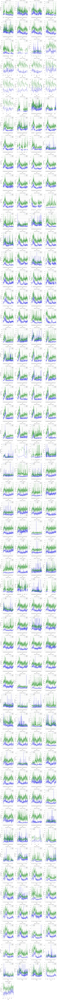

In [ ]:
# Obtén una lista de años únicos y áreas únicas
años = sorted(df_Agg_C['año'].unique())
areas = sorted(df_Agg_C['codigoSerial'].unique())

# Lista para almacenar combinaciones de año y área con datos
combinaciones_validas = []

for año in años:
    for area in areas:
        # Filtrar los datos para cada combinación de año y área
        df_filtro = df_Agg_C[(df_Agg_C['año'] == año) & (df_Agg_C['codigoSerial'] == area)]
        if not df_filtro.empty:
            combinaciones_validas.append((año, area))

# Total de subgráficos
n_graficos = len(combinaciones_validas)

# Configurar el tamaño de la figura y la cuadrícula
fig = plt.figure(figsize=(15, 5 * (n_graficos // 4 + 1)))
gs = gridspec.GridSpec((n_graficos // 4) + 1, 4, figure=fig)  

# Crear subgráficos dinámicamente
for i, (año, area) in enumerate(combinaciones_validas):
    df_filtro = df_Agg_C[(df_Agg_C['año'] == año) & (df_Agg_C['codigoSerial'] == area)]
    
     # Crear un subgráfico
    ax = fig.add_subplot(gs[i])  # Asignar la posición en la cuadrícula
    ax.plot(df_filtro.index, df_filtro['pm25'], label='PM2.5', color='blue', alpha=0.7)
    ax.plot(df_filtro.index, df_filtro['pm10'], label='PM10', color='green', alpha=0.7)
    
    # Mostrar solo meses únicos en el eje x
    meses_unicos = df_filtro.index.to_period('M').unique()  # Obtener meses únicos
    ax.set_xticks([pd.Timestamp(m.start_time) for m in meses_unicos])  # Seleccionar un tick por mes
    ax.set_xticklabels([m.strftime('%b') for m in meses_unicos])  # Nombres de los meses en español
    
    # Configurar títulos y etiquetas
    ax.set_title(f"Año {año} - Área {area}")
    ax.set_xlabel("Mes")
    ax.set_ylabel("Concentración")
    ax.legend()
    ax.grid(True)
    
    # Rotar las etiquetas del eje x
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

# Ajustar el diseño para evitar solapamientos
plt.tight_layout()
plt.show()


In [ ]:
cols_to_plot = ['pm25', 'pm10'] 
axes = df_Agg_C[cols_to_plot].plot(marker='.', alpha=0.5, 
                                   linestyle='None',figsize=(14, 6), 
                                   subplots=True) 
for ax in axes: 
    ax.set_ylabel('Totales diarios') 

1. Comportamiento general de las concentraciones:

PM2.5:

Los valores oscilan mayormente entre 0 y 100 µg/m³, aunque se observan algunos puntos atípicos (superiores a 200 µg/m³), especialmente en ciertos momentos del tiempo.

No parece haber una tendencia general clara, pero los puntos parecen ligeramente más dispersos a partir de 2020.

PM10:

La mayoría de los valores están entre 0 y 150 µg/m³, con algunos valores extremos cercanos a 200 µg/m³.

La variabilidad parece ser mayor que en PM2.5, pero sigue un comportamiento similar.

2. Valores atípicos (outliers):

Ambos gráficos presentan valores extremos que podrían ser eventos inusuales (por ejemplo, incendios forestales, tormentas de polvo, eventos industriales) o errores en los sensores.

Deberías investigar estos picos para confirmar si son datos válidos.

3. Variabilidad temporal:

Hay un patrón estacionario en los datos, es decir, la variabilidad parece mantenerse constante en el tiempo.

4. Dispersión de los datos:

PM2.5: La densidad de puntos es más alta en un rango estrecho, lo que indica menos variación diaria en comparación con PM10.

PM10: La dispersión es mayor, sugiriendo más variación diaria o diferencias significativas entre ubicaciones.


In [ ]:
# Aplicar descomposición estacional
scPM25 = seasonal_decompose(df_Agg_C.pm25, model='additive', period=7)
scPM25.plot()

In [ ]:
# Aplicar descomposición estacional
scPM10 = seasonal_decompose(df_Agg_C.pm10, model='additive', period=7)
scPM10.plot()

In [36]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

In [ ]:
tsplot(df_Agg_C.pm25, lags=60)

In [9]:
from itertools import product

# Definiciones de parametros del modelo
ps = range(2, 5)
d = 1 
qs = range(2, 5)
Ps = range(0, 2)
D = 0 
Qs = range(0, 2)
s = 7  # la duración de la temporada sigue siendo 7 días

# Creando lista con todas las combinaciones posibles de parámetros.
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)

# Imprimir el número total de combinaciones
print(f"Número total de combinaciones: {len(parameters_list)}")


Número total de combinaciones: 36


In [10]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
      Retorno del marco de datos con parámetros y AIC correspondiente.
        
         parameters_list - lista con (p, q, P, Q) tuplas
         d - orden de integración en el modelo ARIMA
         D - orden de integración estacional
         s - duración de la temporada
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm_notebook(parameters_list):
        #  necesitamos intentarlo, excepto porque en algunas combinaciones el modelo no puede converger
        try:
            model=sm.tsa.statespace.SARIMAX(df_Agg_C['pm25'], order=(param[0], d, param[1]), 
                                            seasonal_order=(param[3], D, param[3], s)).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # Guardando mejor modelo, AIC y parámetros.
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    # clasificando en orden ascendente, cuanto más bajo es el AIC, mejor
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table

In [ ]:
result_table = optimizeSARIMA(parameters_list, d, D, s)
result_table.head()

In [12]:
# El conjunto de parámetros que dan el menor AIC

p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(df_Agg_C['pm25'], order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

C:\Users\innov\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\innov\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                   pm25   No. Observations:                66446
Model:               SARIMAX(3, 1, 4)   Log Likelihood             -761293.087
Date:                Thu, 28 Nov 2024   AIC                        1522602.174
Time:                        21:55:39   BIC                        1522675.007
Sample:                             0   HQIC                       1522624.691
                              - 66446                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -2.2652    281.135     -0.008      0.994    -553.279     548.749
ar.L2         -2.2282    369.455     -0.006      0.995    -726.347     721.890
ar.L3         -0.9349    276.110     -0.003      0.9

In [ ]:
# vamos a inspeccionar los residuos del modelo
tsplot(best_model.resid[7+1:], lags=60)

In [14]:
# MSE
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
def plotSARIMA(series, model, n_steps):
    data = series.copy()
    data['arima_model'] = model.fittedvalues
    s, d = model.model.seasonal_periods, model.model.order[1]
    data.iloc[:s + d, data.columns.get_loc('arima_model')] = np.nan
    
    # Pronóstico
    forecast = model.predict(start=data.shape[0], end=data.shape[0] + n_steps - 1)
    if len(forecast) == 0:
        print("El pronóstico no contiene valores.")
        return
    
    # Índice del pronóstico
    forecast_index = pd.date_range(start=data.index[-1], periods=n_steps + 1, freq='D')[1:]
    forecast = pd.Series(forecast, index=forecast_index)
    forecast_combined = pd.concat([data['arima_model'], forecast])
    
    # Series reales y predichas
    true_values = data['pm25'][s + d:]
    predicted_values = forecast_combined[s + d:]
    
    # Alinear series
    true_values, predicted_values = true_values.align(predicted_values, join='inner')
    if true_values.empty or predicted_values.empty:
        print("Las series están vacías o no se pudieron alinear.")
        return
    
    # MAPE
    error = mean_absolute_percentage_error(true_values, predicted_values)
    
    # Gráfico
    plt.figure(figsize=(15, 7))
    plt.title(f"Mean Absolute Percentage Error: {error:.2f}%")
    plt.plot(forecast_combined, color='r', label="Modelo (Predicción)")
    plt.axvspan(data.index[-1], forecast_combined.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(data['pm25'], label="Actual")
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
# Llamar a la función con el DataFrame y el modelo (cambiar `df_Agg_C` y `best_model` con tus datos y modelo reales)
plotSARIMA(df_Agg_C, best_model, 730)  # Pronóstico de 730 días (aproximadamente 2 años)


In [ ]:
# Función para optimizar parámetros SARIMA
def optimizeSARIMA(parameters_list, d, D, s, series):
    results = []
    best_aic = float("inf")

    for param in parameters_list:
        try:
            model = sm.tsa.statespace.SARIMAX(series, 
                                              order=(param[0], d, param[1]), 
                                              seasonal_order=(param[2], D, param[3], s)).fit(disp=False)
        except Exception as e:
            print(f"Error al ajustar SARIMA con parámetros {param}: {e}")
            continue
        aic = model.aic
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table

# Función para graficar SARIMA para cada área
def plotSARIMA(series, model, n_steps):
    """
    Genera gráficos de los valores reales vs los valores predichos por SARIMA.
    series: Serie temporal.
    model: Modelo SARIMA ajustado.
    n_steps: Número de pasos para predecir hacia el futuro.
    """
    data = series.copy().to_frame(name='pm25')  # Convertir a DataFrame si es necesario
    data['arima_model'] = model.fittedvalues
    s, d = model.model.seasonal_periods, model.model.order[1]
    data.iloc[:s + d, data.columns.get_loc('arima_model')] = np.nan
    
    # Pronóstico
    forecast = model.get_forecast(steps=n_steps).predicted_mean
    forecast_index = pd.date_range(start=data.index[-1], periods=n_steps + 1, freq='D')[1:]
    forecast = pd.Series(forecast.values, index=forecast_index)
    forecast_combined = pd.concat([data['arima_model'], forecast])
    
    # Series reales y predichas
    true_values = data['pm25'][s + d:]
    predicted_values = forecast_combined[s + d:]
    
    # Alinear series
    true_values, predicted_values = true_values.align(predicted_values, join='inner')
    
    # MAPE
    error = mean_absolute_percentage_error(true_values, predicted_values)
    
    # Gráfico
    plt.figure(figsize=(15, 7))
    plt.title(f"Mean Absolute Percentage Error: {error:.2f}%")
    plt.plot(forecast_combined, color='r', label="Modelo (Predicción)")
    plt.axvspan(data.index[-1], forecast_combined.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(data['pm25'], label="Actual")
    plt.legend()
    plt.grid(True)
    plt.show()
    return forecast  # Devolver pronóstico generado

# Iterar sobre cada área
def analyze_by_area(df, parameters_list, d, D, s, n_steps):
    """
    Aplica SARIMA y genera gráficos para cada área en el conjunto de datos.
    
    df: DataFrame con datos de series temporales y columna 'area'.
    parameters_list: Lista de parámetros (p, d, q, P, Q).
    d: Orden de diferenciación.
    D: Orden de diferenciación estacional.
    s: Periodo estacional.
    n_steps: Número de pasos para predecir hacia el futuro.
    """
    for area in df_Agg_C['codigoSerial'].unique():
        print(f"Analizando el área: {area}")
        area_data = df_Agg_C[df_Agg_C['codigoSerial'] == area]['pm25']  # Filtrar por área
        if area_data.empty:
            print(f"No hay datos para el área: {area}")
            continue
        
        # Optimización de parámetros
        result_table = optimizeSARIMA(parameters_list, d, D, s, area_data)
        if result_table.empty:
            print(f"No se pudo optimizar para el área: {area}")
            continue
        
        p, q, P, Q = result_table.parameters[0]
        
        # Ajustar modelo con los mejores parámetros
        best_model = sm.tsa.statespace.SARIMAX(area_data, 
                                               order=(p, d, q), 
                                               seasonal_order=(P, D, Q, s)).fit(disp=False)
        
        print(best_model.summary())  # Mostrar resumen del modelo
        print(f"Parámetros óptimos: {p, d, q}, {P, D, Q, s}")
        
        # Generar gráfico y obtener pronóstico
        forecast = plotSARIMA(area_data, best_model, n_steps)
        print(f"Pronóstico para {area}:\n{forecast}\n")

# Parámetros y ejemplo de uso
parameters_list = [(2, 3, 1, 0), (2, 3, 0, 0), (2, 2, 0, 1), (2, 2, 1, 1), (2, 3, 0, 1)]
d, D, s = 2, 1, 7  # Ejemplo de valores para diferenciación y estacionalidad
n_steps = 600  # Número de pasos a predecir

# Asegúrate de que 'df_Agg_C' contiene las columnas necesarias: 'area', 'pm25'
analyze_by_area(df_Agg_C, parameters_list, d, D, s, n_steps)

print(forecast.head())
print(forecast.describe())



In [204]:
# Calcular el promedio diario
df_prom_diario_pm25 = df_Agg_C['pm25'].resample('D').mean()

# Asegurarte de que el resultado sea un DataFrame y asignar un nombre a la columna
df_prom_diario_pm25 = df_prom_diario_pm25.to_frame(name='prom_dia_pm25')


In [205]:
print(df_prom_diario_pm25.head())
print(df_prom_diario_pm25.index.freq)  # Verifica la frecuencia


            prom_dia_pm25
fecha                    
2017-01-01      36.656250
2017-01-02      16.182292
2017-01-03      19.838542
2017-01-04      26.427083
2017-01-05      28.984375
<Day>


In [236]:
# Definiciones de parametros del modelo
#  Configuración de valores iniciales y algunos límites para ellos.
ps = range(2, 6)
d=1 
qs = range(2, 6)
Ps = range(0, 2)
D=1 
Qs = range(0, 2)
s = 7 # la duración de la temporada sigue siendo 24

# Creando lista con todas las combinaciones posibles de parámetros.
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

64

In [237]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
      Retorno del marco de datos con parámetros y AIC correspondiente.
        
         parameters_list - lista con (p, q, P, Q) tuplas
         d - orden de integración en el modelo ARIMA
         D - orden de integración estacional
         s - duración de la temporada
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm_notebook(parameters_list):
        #  necesitamos intentarlo, excepto porque en algunas combinaciones el modelo no puede converger
        try:
            model=sm.tsa.statespace.SARIMAX(df_prom_diario_pm25, order=(param[0], d, param[1]), 
                                            seasonal_order=(param[3], D, param[3], s)).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # Guardando mejor modelo, AIC y parámetros.
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    # clasificando en orden ascendente, cuanto más bajo es el AIC, mejor
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table

In [ ]:
result_table = optimizeSARIMA(parameters_list, d, D, s)
result_table.head()

In [239]:
# El conjunto de parámetros que dan el menor AIC

p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(df_prom_diario_pm25, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

C:\Users\innov\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\innov\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


                                      SARIMAX Results                                      
Dep. Variable:                       prom_dia_pm25   No. Observations:                 2830
Model:             SARIMAX(2, 1, 2)x(0, 1, [1], 7)   Log Likelihood               -8083.564
Date:                             Thu, 28 Nov 2024   AIC                          16179.127
Time:                                     20:35:21   BIC                          16214.799
Sample:                                 01-01-2017   HQIC                         16191.998
                                      - 09-30-2024                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4873      0.023    -21.465      0.000      -0.532      -0.443
ar.L2          0.4917      

In [ ]:
# vamos a inspeccionar los residuos del modelo
tsplot(best_model.resid[7+1:], lags=80)

In [241]:
# MSE
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


In [242]:
def plotSARIMA(data, model, steps):
    """
    Grafica los datos reales junto con el pronóstico SARIMA, mejorando la estética.
    """
    # Pronóstico
    forecast = model.forecast(steps=steps)
    forecast_index = pd.date_range(data.index[-1], periods=steps + 1, freq="D")[1:]
    forecast_series = pd.Series(forecast, index=forecast_index)

    # Concatenar datos reales con pronóstico
    combined_series = pd.concat([data, forecast_series])

    # Gráfico
    plt.figure(figsize=(15, 8))
    plt.plot(data.index, data, label="Datos reales", color="blue", linewidth=0.8)
    plt.plot(forecast_series.index, forecast_series, label="Pronóstico SARIMA", color="red", linewidth=1.5)

    # Opcional: intervalo de confianza (simulado aquí)
    confidence_interval_lower = forecast_series - 2
    confidence_interval_upper = forecast_series + 2
    plt.fill_between(
        forecast_series.index, confidence_interval_lower, confidence_interval_upper,
        color="red", alpha=0.2, label="Intervalo de confianza (±2)"
    )

    plt.axvline(x=data.index[-1], color='black', linestyle='--', linewidth=1, label="Inicio del pronóstico")

    # Mejorar los ejes
    plt.title("Pronóstico de PM2.5 a 2 años", fontsize=16)
    plt.xlabel("Fecha", fontsize=14)
    plt.ylabel("Concentración PM2.5 (µg/m³)", fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(alpha=0.5)
    plt.legend(loc="upper left", fontsize=12)
    plt.tight_layout()
    plt.show()


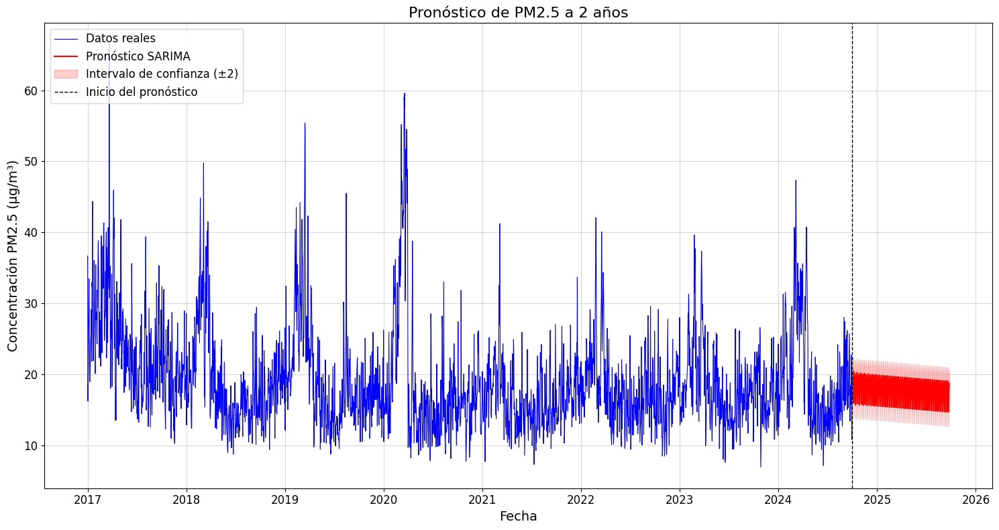

In [243]:
plotSARIMA(df_prom_diario_pm25.prom_dia_pm25, best_model, 360)

## PM10

In [ ]:
tsplot(df_Agg_C.pm10, lags=60)

In [244]:
from itertools import product

# Definiciones de parametros del modelo
ps = range(2, 5)
d = 1 
qs = range(2, 5)
Ps = range(0, 2)
D = 0 
Qs = range(0, 2)
s = 7  # la duración de la temporada sigue siendo 7 días

# Creando lista con todas las combinaciones posibles de parámetros.
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)

# Imprimir el número total de combinaciones
print(f"Número total de combinaciones: {len(parameters_list)}")

Número total de combinaciones: 36


In [245]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
      Retorno del marco de datos con parámetros y AIC correspondiente.
        
         parameters_list - lista con (p, q, P, Q) tuplas
         d - orden de integración en el modelo ARIMA
         D - orden de integración estacional
         s - duración de la temporada
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm_notebook(parameters_list):
        #  necesitamos intentarlo, excepto porque en algunas combinaciones el modelo no puede converger
        try:
            model=sm.tsa.statespace.SARIMAX(df_Agg_C['pm10'], order=(param[0], d, param[1]), 
                                            seasonal_order=(param[3], D, param[3], s)).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # Guardando mejor modelo, AIC y parámetros.
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    # clasificando en orden ascendente, cuanto más bajo es el AIC, mejor
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table

In [ ]:
result_table = optimizeSARIMA(parameters_list, d, D, s)
result_table.head()

In [247]:
# El conjunto de parámetros que dan el menor AIC

p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(df_Agg_C['pm10'], order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

C:\Users\innov\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\innov\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\innov\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimi

                                      SARIMAX Results                                      
Dep. Variable:                                pm10   No. Observations:                66446
Model:             SARIMAX(4, 1, 3)x(1, 0, [1], 7)   Log Likelihood             -248286.466
Date:                             Thu, 28 Nov 2024   AIC                         496592.933
Time:                                     20:56:18   BIC                         496683.974
Sample:                                          0   HQIC                        496621.079
                                           - 66446                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2837      0.012   -110.943      0.000      -1.306      -1.261
ar.L2         -0.8472      

In [ ]:
# vamos a inspeccionar los residuos del modelo
tsplot(best_model.resid[7+1:], lags=60)

In [249]:
# MSE
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [251]:
def plotSARIMA(series, model, n_steps):
    data = series.copy()
    data['arima_model'] = model.fittedvalues
    s, d = model.model.seasonal_periods, model.model.order[1]
    data.iloc[:s + d, data.columns.get_loc('arima_model')] = np.nan
    
    # Pronóstico
    forecast = model.predict(start=data.shape[0], end=data.shape[0] + n_steps - 1)
    if len(forecast) == 0:
        print("El pronóstico no contiene valores.")
        return
    
    # Índice del pronóstico
    forecast_index = pd.date_range(start=data.index[-1], periods=n_steps + 1, freq='D')[1:]
    forecast = pd.Series(forecast, index=forecast_index)
    forecast_combined = pd.concat([data['arima_model'], forecast])
    
    # Series reales y predichas
    true_values = data['pm10'][s + d:]
    predicted_values = forecast_combined[s + d:]
    
    # Alinear series
    true_values, predicted_values = true_values.align(predicted_values, join='inner')
    if true_values.empty or predicted_values.empty:
        print("Las series están vacías o no se pudieron alinear.")
        return
    
    # MAPE
    error = mean_absolute_percentage_error(true_values, predicted_values)
    
    # Gráfico
    plt.figure(figsize=(15, 7))
    plt.title(f"Mean Absolute Percentage Error: {error:.2f}%")
    plt.plot(forecast_combined, color='r', label="Modelo (Predicción)")
    plt.axvspan(data.index[-1], forecast_combined.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(data['pm25'], label="Actual")
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
# Llamar a la función con el DataFrame y el modelo (cambiar `df_Agg_C` y `best_model` con tus datos y modelo reales)
plotSARIMA(df_Agg_C, best_model, 730)  # Pronóstico de 730 días (aproximadamente 2 años)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_percentage_error

# Función para optimizar parámetros SARIMA
def optimizeSARIMA(parameters_list, d, D, s, series):
    results = []
    best_aic = float("inf")

    for param in parameters_list:
        try:
            model = sm.tsa.statespace.SARIMAX(series, 
                                              order=(param[0], d, param[1]), 
                                              seasonal_order=(param[2], D, param[3], s)).fit(disp=False)
        except Exception as e:
            print(f"Error al ajustar SARIMA con parámetros {param}: {e}")
            continue
        aic = model.aic
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table

# Función para graficar SARIMA para cada área
def plotSARIMA(series, model, n_steps):
    """
    Genera gráficos de los valores reales vs los valores predichos por SARIMA.
    series: Serie temporal.
    model: Modelo SARIMA ajustado.
    n_steps: Número de pasos para predecir hacia el futuro.
    """
    data = series.copy().to_frame(name='pm10')  # Convertir a DataFrame si es necesario
    data['arima_model'] = model.fittedvalues
    s, d = model.model.seasonal_periods, model.model.order[1]
    data.iloc[:s + d, data.columns.get_loc('arima_model')] = np.nan
    
    # Pronóstico
    forecast = model.get_forecast(steps=n_steps).predicted_mean
    forecast_index = pd.date_range(start=data.index[-1], periods=n_steps + 1, freq='D')[1:]
    forecast = pd.Series(forecast.values, index=forecast_index)
    forecast_combined = pd.concat([data['arima_model'], forecast])
    
    # Series reales y predichas
    true_values = data['pm10'][s + d:]
    predicted_values = forecast_combined[s + d:]
    
    # Alinear series
    true_values, predicted_values = true_values.align(predicted_values, join='inner')
    
    # MAPE
    error = mean_absolute_percentage_error(true_values, predicted_values)
    
    # Gráfico
    plt.figure(figsize=(20, 10))
    plt.title(f"Mean Absolute Percentage Error: {error:.2f}%")
    plt.plot(forecast_combined, color='r', label="Modelo (Predicción)")
    plt.axvspan(data.index[-1], forecast_combined.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(data['pm10'], label="Actual")
    plt.legend()
    plt.grid(True)
    plt.show()
    return forecast  # Devolver pronóstico generado

# Iterar sobre cada área
def analyze_by_area(df, parameters_list, d, D, s, n_steps):
    """
    Aplica SARIMA y genera gráficos para cada área en el conjunto de datos.
    
    df: DataFrame con datos de series temporales y columna 'area'.
    parameters_list: Lista de parámetros (p, d, q, P, Q).
    d: Orden de diferenciación.
    D: Orden de diferenciación estacional.
    s: Periodo estacional.
    n_steps: Número de pasos para predecir hacia el futuro.
    """
    for area in df['codigoSerial'].unique():
        print(f"Analizando el área: {area}")
        area_data = df[df['codigoSerial'] == area]['pm10']  # Filtrar por área
        if area_data.empty:
            print(f"No hay datos para el área: {area}")
            continue
        
        # Optimización de parámetros
        result_table = optimizeSARIMA(parameters_list, d, D, s, area_data)
        if result_table.empty:
            print(f"No se pudo optimizar para el área: {area}")
            continue
        
        p, q, P, Q = result_table.parameters[0]
        
        # Ajustar modelo con los mejores parámetros
        best_model = sm.tsa.statespace.SARIMAX(area_data, 
                                               order=(p, d, q), 
                                               seasonal_order=(P, D, Q, s)).fit(disp=False)
        
        print(best_model.summary())  # Mostrar resumen del modelo
        print(f"Parámetros óptimos: {p, d, q}, {P, D, Q, s}")
        
        # Generar gráfico y obtener pronóstico
        forecast = plotSARIMA(area_data, best_model, n_steps)
        print(f"Pronóstico para {area}:\n{forecast}\n")

# Parámetros y ejemplo de uso
parameters_list = [(2, 3, 1, 0), (2, 3, 0, 0), (2, 2, 0, 1), (2, 2, 1, 1), (2, 3, 0, 1)]
d, D, s = 1, 1, 7  # Ejemplo de valores para diferenciación y estacionalidad
n_steps = 730  # Número de pasos a predecir

# Asegúrate de que 'df_Agg_C' contiene las columnas necesarias: 'area', 'pm25'
analyze_by_area(df_Agg_C, parameters_list, d, D, s, n_steps)

In [254]:
# Calcular el promedio diario
df_prom_diario_pm10 = df_Agg_C['pm10'].resample('D').mean()

# Asegurarte de que el resultado sea un DataFrame y asignar un nombre a la columna
df_prom_diario_pm10 = df_prom_diario_pm10.to_frame(name='prom_dia_pm10')


In [255]:
print(df_prom_diario_pm10.head())
print(df_prom_diario_pm10.index.freq)  # Verifica la frecuencia


            prom_dia_pm10
fecha                    
2017-01-01      51.734375
2017-01-02      39.312500
2017-01-03      43.494792
2017-01-04      50.531250
2017-01-05      49.125000
<Day>


In [ ]:
# 3. Configuración del modelo SARIMA
pred_steps = 730  # 2 años de pronóstico

# Ajustar el modelo SARIMA
model = SARIMAX(df_prom_diario_pm10, 
                order=(2, 2, 1), 
                seasonal_order=(1, 0, 1, 7))  # Ajusta los órdenes según sea necesario
model_fit = model.fit(disp=False)

# 4. Generar el pronóstico
forecast = model_fit.forecast(steps=pred_steps)

# Crear índice para el pronóstico
forecast_index = pd.date_range(start=df_prom_diario_pm10.index[-1], periods=pred_steps + 1, freq='D')[1:]
forecast_series = pd.Series(forecast, index=forecast_index)

# 5. Visualización del pronóstico
plt.figure(figsize=(15, 8))
plt.plot(df_prom_diario_pm10.index, df_prom_diario_pm10, label="Datos reales", color="blue")
plt.plot(forecast_series.index, forecast_series, label="Pronóstico", color="red")
plt.axvline(x=df_prom_diario_pm10.index[-1], color='black', linestyle='--', label="Inicio del pronóstico")
plt.title("Pronóstico de PM10 para los próximos 2 años")
plt.xlabel("Fecha")
plt.ylabel("PM10")
plt.legend()
plt.grid(True)
plt.show()

# 6. Mostrar el pronóstico (opcional)
print(forecast_series)

In [257]:
# Definiciones de parametros del modelo
#  Configuración de valores iniciales y algunos límites para ellos.
ps = range(2, 6)
d=1 
qs = range(2, 6)
Ps = range(0, 2)
D=1 
Qs = range(0, 2)
s = 7 # la duración de la temporada sigue siendo 24

# Creando lista con todas las combinaciones posibles de parámetros.
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

64

In [258]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
      Retorno del marco de datos con parámetros y AIC correspondiente.
        
         parameters_list - lista con (p, q, P, Q) tuplas
         d - orden de integración en el modelo ARIMA
         D - orden de integración estacional
         s - duración de la temporada
    """
    
    results = []
    best_aic = float("inf")

    for param in tqdm_notebook(parameters_list):
        #  necesitamos intentarlo, excepto porque en algunas combinaciones el modelo no puede converger
        try:
            model=sm.tsa.statespace.SARIMAX(df_prom_diario_pm10, order=(param[0], d, param[1]), 
                                            seasonal_order=(param[3], D, param[3], s)).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # Guardando mejor modelo, AIC y parámetros.
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', 'aic']
    # clasificando en orden ascendente, cuanto más bajo es el AIC, mejor
    result_table = result_table.sort_values(by='aic', ascending=True).reset_index(drop=True)
    
    return result_table

In [ ]:
result_table = optimizeSARIMA(parameters_list, d, D, s)
result_table.head()

In [260]:
# El conjunto de parámetros que dan el menor AIC

p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(df_prom_diario_pm10, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

C:\Users\innov\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


                                      SARIMAX Results                                      
Dep. Variable:                       prom_dia_pm10   No. Observations:                 2830
Model:             SARIMAX(2, 1, 2)x(0, 1, [1], 7)   Log Likelihood               -9373.985
Date:                             Thu, 28 Nov 2024   AIC                          18759.970
Time:                                     21:14:32   BIC                          18795.641
Sample:                                 01-01-2017   HQIC                         18772.841
                                      - 09-30-2024                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4021      0.035     39.984      0.000       1.333       1.471
ar.L2         -0.4209      

In [ ]:
# vamos a inspeccionar los residuos del modelo
tsplot(best_model.resid[7+1:], lags=80)

In [262]:
# MSE
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


In [263]:
def plotSARIMA(data, model, steps):
    """
    Grafica los datos reales junto con el pronóstico SARIMA, mejorando la estética.
    """
    # Pronóstico
    forecast = model.forecast(steps=steps)
    forecast_index = pd.date_range(data.index[-1], periods=steps + 1, freq="D")[1:]
    forecast_series = pd.Series(forecast, index=forecast_index)

    # Concatenar datos reales con pronóstico
    combined_series = pd.concat([data, forecast_series])

    # Gráfico
    plt.figure(figsize=(15, 8))
    plt.plot(data.index, data, label="Datos reales", color="blue", linewidth=0.8)
    plt.plot(forecast_series.index, forecast_series, label="Pronóstico SARIMA", color="red", linewidth=1.5)

    # Opcional: intervalo de confianza (simulado aquí)
    confidence_interval_lower = forecast_series - 2
    confidence_interval_upper = forecast_series + 2
    plt.fill_between(
        forecast_series.index, confidence_interval_lower, confidence_interval_upper,
        color="red", alpha=0.2, label="Intervalo de confianza (±2)"
    )

    plt.axvline(x=data.index[-1], color='black', linestyle='--', linewidth=1, label="Inicio del pronóstico")

    # Mejorar los ejes
    plt.title("Pronóstico de PM10 a 2 años", fontsize=16)
    plt.xlabel("Fecha", fontsize=14)
    plt.ylabel("Concentración PM10 (µg/m³)", fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(alpha=0.5)
    plt.legend(loc="upper left", fontsize=12)
    plt.tight_layout()
    plt.show()

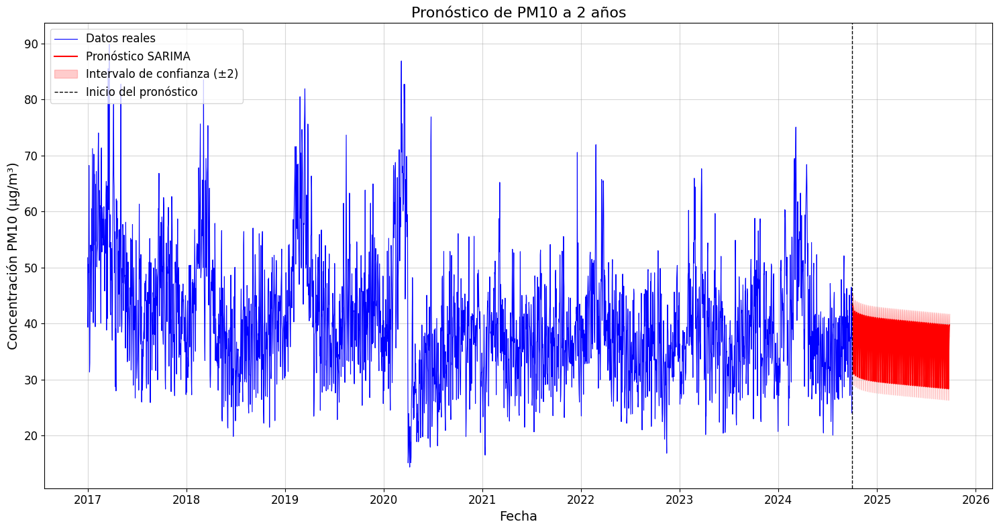

In [265]:
plotSARIMA(df_prom_diario_pm10.prom_dia_pm10, best_model, 360)